# Data-Preprocessing

## Import Data


In [ ]:
# Import data using pandas

import pandas as pd
import requests

In [ ]:
pip install sodapy


In [ ]:
import requests
import pandas as pd
import numpy as np

# API Endpoint
BASE_URL = "https://data.sfgov.org/resource/8pxu-u28x.json"

# Parameters
LIMIT = 1000  # Max rows per request
OFFSET = 0  # Starting point
MAX_ROWS = 500000  # Maximum rows to fetch
ALL_DATA = []  # List to store all records

# Fetch data in chunks
while OFFSET < MAX_ROWS:
    params = {"$limit": LIMIT, "$offset": OFFSET, "$order": "date_added DESC"}
    response = requests.get(BASE_URL, params=params)

    if response.status_code != 200:
        print(f"Error: {response.status_code}")
        break

    data = response.json()
    if not data:
        break

    ALL_DATA.extend(data)
    OFFSET += LIMIT
    print(f"Retrieved {len(ALL_DATA)} records so far...")

# Create DataFrame
df = pd.DataFrame(ALL_DATA)

# Show available columns (for debugging/future reference)
print("Available columns in API data:", df.columns.tolist())

# Ensure 'date_added' is in datetime format
df['date_added'] = pd.to_datetime(df['date_added'], errors='coerce')

# Sort by date and keep most recent
df = df.sort_values(by='date_added', ascending=False).head(MAX_ROWS)

# Safely select available relevant columns
desired_cols = ['citation_number', 'violation', 'violation_desc', 'citation_location',
                'fine_amount', 'date_added', 'the_geom', 'supervisor_districts',
                'analysis_neighborhood', 'latitude', 'longitude']

df = df[[col for col in desired_cols if col in df.columns]]

print(f"Final dataset contains {df.shape[0]} rows and {df.shape[1]} columns (latest entries).")
df.head()


Retrieved 1000 records so far...
Retrieved 2000 records so far...
Retrieved 3000 records so far...
Retrieved 4000 records so far...
Retrieved 5000 records so far...
Retrieved 6000 records so far...
Retrieved 7000 records so far...
Retrieved 8000 records so far...
Retrieved 9000 records so far...
Retrieved 10000 records so far...
Retrieved 11000 records so far...
Retrieved 12000 records so far...
Retrieved 13000 records so far...
Retrieved 14000 records so far...
Retrieved 15000 records so far...
Retrieved 16000 records so far...
Retrieved 17000 records so far...
Retrieved 18000 records so far...
Retrieved 19000 records so far...
Retrieved 20000 records so far...
Retrieved 21000 records so far...
Retrieved 22000 records so far...
Retrieved 23000 records so far...
Retrieved 24000 records so far...
Retrieved 25000 records so far...
Retrieved 26000 records so far...
Retrieved 27000 records so far...
Retrieved 28000 records so far...
Retrieved 29000 records so far...
Retrieved 30000 records

,citation_number,violation,violation_desc,citation_location,fine_amount,date_added,the_geom,supervisor_districts,analysis_neighborhood,latitude,longitude
0,10820401T,TRC7.2.101A,FAIL DISPL,MISSION ST & 9TH ST,130.0,2025-04-23,NaN,NaN,NaN,NaN,NaN
265,11091334T,TRC7.2.101A,FAIL DISPL,MARKET ST & SOUTH VAN NESS AVE,130.0,2025-04-23,NaN,NaN,NaN,NaN,NaN
289,11039545T,TRC7.2.101A,FAIL DISPL,POTRERO AVE & 23RD ST,130.0,2025-04-23,NaN,NaN,NaN,NaN,NaN
288,11082455T,TRC7.2.101A,FAIL DISPL,,0.0,2025-04-23,NaN,NaN,NaN,NaN,NaN
287,11086390T,TRC7.2.101A,FAIL DISPL,,0.0,2025-04-23,NaN,NaN,NaN,NaN,NaN


In [ ]:
df.head()


,citation_number,violation,violation_desc,citation_location,fine_amount,date_added,the_geom,supervisor_districts,analysis_neighborhood,latitude,longitude
0,10820401T,TRC7.2.101A,FAIL DISPL,MISSION ST & 9TH ST,130.0,2025-04-23,NaN,NaN,NaN,NaN,NaN
265,11091334T,TRC7.2.101A,FAIL DISPL,MARKET ST & SOUTH VAN NESS AVE,130.0,2025-04-23,NaN,NaN,NaN,NaN,NaN
289,11039545T,TRC7.2.101A,FAIL DISPL,POTRERO AVE & 23RD ST,130.0,2025-04-23,NaN,NaN,NaN,NaN,NaN
288,11082455T,TRC7.2.101A,FAIL DISPL,,0.0,2025-04-23,NaN,NaN,NaN,NaN,NaN
287,11086390T,TRC7.2.101A,FAIL DISPL,,0.0,2025-04-23,NaN,NaN,NaN,NaN,NaN


## 1️⃣ Convert DateTime Columns


In [ ]:
# Convert 'date_added' to datetime format
df['date_added'] = pd.to_datetime(df['date_added'], errors='coerce')

# Extract useful time features
df['year'] = df['date_added'].dt.year
df['month'] = df['date_added'].dt.month
df['day'] = df['date_added'].dt.day
df['hour'] = df['date_added'].dt.hour
df['weekday'] = df['date_added'].dt.weekday
df['weekend'] = df['weekday'].apply(lambda x: 1 if x >= 5 else 0)

# Drop original date_added column
df.drop(columns=['date_added'], inplace=True)

df.head()


,citation_number,violation,violation_desc,citation_location,fine_amount,the_geom,supervisor_districts,analysis_neighborhood,latitude,longitude,year,month,day,hour,weekday,weekend
0,10820401T,TRC7.2.101A,FAIL DISPL,MISSION ST & 9TH ST,130.0,NaN,NaN,NaN,NaN,NaN,2025,4,23,0,2,0
265,11091334T,TRC7.2.101A,FAIL DISPL,MARKET ST & SOUTH VAN NESS AVE,130.0,NaN,NaN,NaN,NaN,NaN,2025,4,23,0,2,0
289,11039545T,TRC7.2.101A,FAIL DISPL,POTRERO AVE & 23RD ST,130.0,NaN,NaN,NaN,NaN,NaN,2025,4,23,0,2,0
288,11082455T,TRC7.2.101A,FAIL DISPL,,0.0,NaN,NaN,NaN,NaN,NaN,2025,4,23,0,2,0
287,11086390T,TRC7.2.101A,FAIL DISPL,,0.0,NaN,NaN,NaN,NaN,NaN,2025,4,23,0,2,0


## Handle Categorical Variables

In [ ]:
# Convert categorical columns to strings
df['violation_desc'] = df['violation_desc'].astype(str)
df['citation_location'] = df['citation_location'].astype(str)
df['analysis_neighborhood'] = df['analysis_neighborhood'].astype(str)

# Drop unnecessary columns
df.drop(columns=['citation_number'], inplace=True)

# One-Hot Encode Categorical Variables
df = pd.get_dummies(df, columns=['violation_desc', 'analysis_neighborhood'], drop_first=True)

df.head()


,violation,citation_location,fine_amount,the_geom,supervisor_districts,latitude,longitude,year,month,day,...,analysis_neighborhood_Russian Hill,analysis_neighborhood_South of Market,analysis_neighborhood_Sunset/Parkside,analysis_neighborhood_Tenderloin,analysis_neighborhood_Treasure Island,analysis_neighborhood_Twin Peaks,analysis_neighborhood_Visitacion Valley,analysis_neighborhood_West of Twin Peaks,analysis_neighborhood_Western Addition,analysis_neighborhood_nan
0,TRC7.2.101A,MISSION ST & 9TH ST,130.0,NaN,NaN,NaN,NaN,2025,4,23,...,False,False,False,False,False,False,False,False,False,True
265,TRC7.2.101A,MARKET ST & SOUTH VAN NESS AVE,130.0,NaN,NaN,NaN,NaN,2025,4,23,...,False,False,False,False,False,False,False,False,False,True
289,TRC7.2.101A,POTRERO AVE & 23RD ST,130.0,NaN,NaN,NaN,NaN,2025,4,23,...,False,False,False,False,False,False,False,False,False,True
288,TRC7.2.101A,,0.0,NaN,NaN,NaN,NaN,2025,4,23,...,False,False,False,False,False,False,False,False,False,True
287,TRC7.2.101A,,0.0,NaN,NaN,NaN,NaN,2025,4,23,...,False,False,False,False,False,False,False,False,False,True


## Handle Missing Values

In [ ]:
# Fill missing values in categorical columns
df['citation_location'].fillna("Unknown", inplace=True)

# Drop rows with missing fine amounts (important for regression task)
df.dropna(subset=['fine_amount'], inplace=True)

print(f"Data Preprocessing Complete! 🚀 Ready for ML Modeling.")
df.head()


<ipython-input-40-e5097e1a1b34>:2: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  df['citation_location'].fillna("Unknown", inplace=True)


Data Preprocessing Complete! 🚀 Ready for ML Modeling.


,violation,citation_location,fine_amount,the_geom,supervisor_districts,latitude,longitude,year,month,day,...,analysis_neighborhood_Russian Hill,analysis_neighborhood_South of Market,analysis_neighborhood_Sunset/Parkside,analysis_neighborhood_Tenderloin,analysis_neighborhood_Treasure Island,analysis_neighborhood_Twin Peaks,analysis_neighborhood_Visitacion Valley,analysis_neighborhood_West of Twin Peaks,analysis_neighborhood_Western Addition,analysis_neighborhood_nan
0,TRC7.2.101A,MISSION ST & 9TH ST,130.0,NaN,NaN,NaN,NaN,2025,4,23,...,False,False,False,False,False,False,False,False,False,True
265,TRC7.2.101A,MARKET ST & SOUTH VAN NESS AVE,130.0,NaN,NaN,NaN,NaN,2025,4,23,...,False,False,False,False,False,False,False,False,False,True
289,TRC7.2.101A,POTRERO AVE & 23RD ST,130.0,NaN,NaN,NaN,NaN,2025,4,23,...,False,False,False,False,False,False,False,False,False,True
288,TRC7.2.101A,,0.0,NaN,NaN,NaN,NaN,2025,4,23,...,False,False,False,False,False,False,False,False,False,True
287,TRC7.2.101A,,0.0,NaN,NaN,NaN,NaN,2025,4,23,...,False,False,False,False,False,False,False,False,False,True


In [ ]:
# Drop unnecessary columns (Vehicle Plate and Citation Number)
# This has been done previously so skipping
#df.drop(columns=['citation_number', 'vehicle_plate'], inplace=True)

print(f"Data Preprocessing Complete! 🚀 Ready for ML Modeling.")

Data Preprocessing Complete! 🚀 Ready for ML Modeling.


# Insight Generation

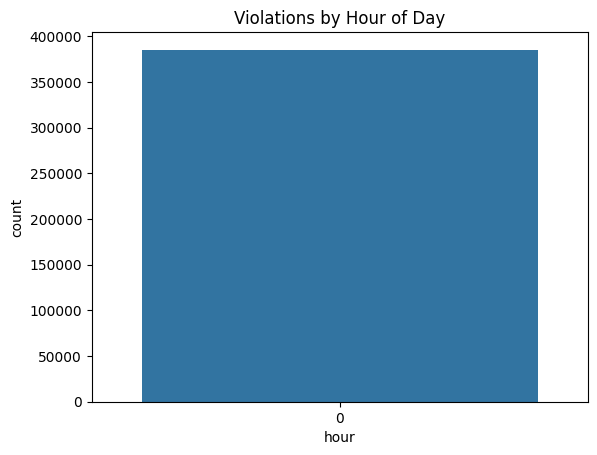

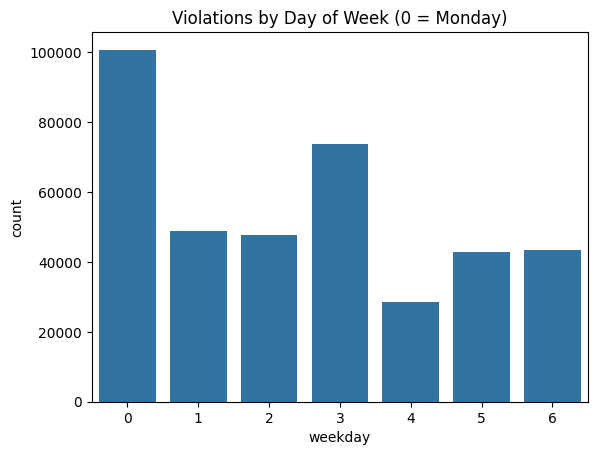

In [ ]:
# --------------------------------------------
# 📊 EDA: Violations by Hour and Day
# --------------------------------------------
import seaborn as sns
import matplotlib.pyplot as plt

sns.countplot(data=df, x='hour')
plt.title("Violations by Hour of Day")
plt.show()

sns.countplot(data=df, x='weekday')
plt.title("Violations by Day of Week (0 = Monday)")
plt.show()

<ipython-input-43-649939c1a29b>:12: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=top_locations.index, y=top_locations.values, palette="viridis")


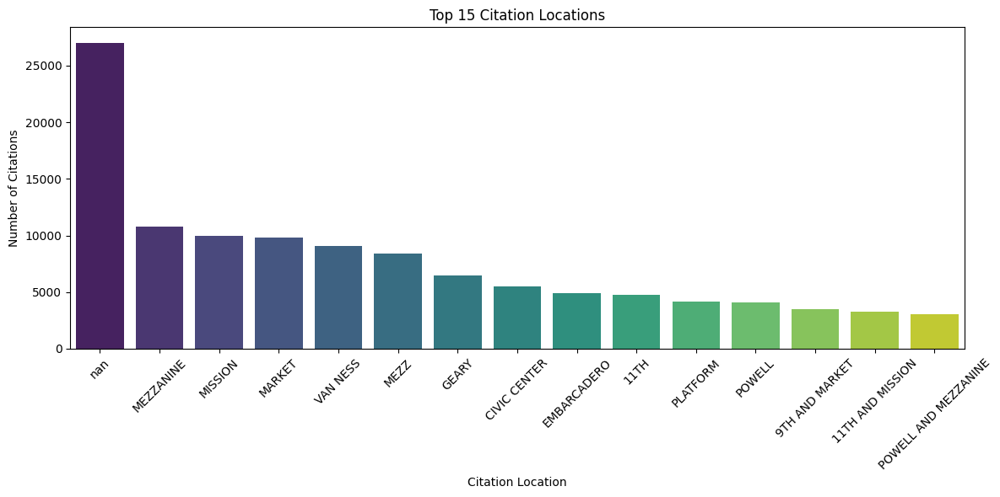

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

# Remove NaNs from citation location column
df_cleaned = df.dropna(subset=['citation_location'])

# Get top 15 locations
top_locations = df_cleaned['citation_location'].value_counts().head(15)

# Plot using seaborn
plt.figure(figsize=(12, 6))
sns.barplot(x=top_locations.index, y=top_locations.values, palette="viridis")
plt.xticks(rotation=45)
plt.xlabel("Citation Location")
plt.ylabel("Number of Citations")
plt.title("Top 15 Citation Locations")
plt.tight_layout()
plt.show()



In [ ]:
# Clean coordinates from 'the_geom' even if lat/lon exist
def extract_coords(point_str):
    try:
        point = point_str.replace("POINT (", "").replace(")", "")
        lon, lat = map(float, point.split())
        return pd.Series([lat, lon])
    except:
        return pd.Series([None, None])

# Overwrite existing lat/lon
df[['latitude', 'longitude']] = df['the_geom'].apply(extract_coords)


In [ ]:
import folium
from folium.plugins import HeatMap

# Drop rows with invalid/missing coordinates
map_df = df.dropna(subset=['latitude', 'longitude'])

# Create a folium map centered on San Francisco
m = folium.Map(location=[37.76, -122.45], zoom_start=13)

# Extract coordinate pairs
heat_data = map_df[['latitude', 'longitude']].values.tolist()

# Add heat layer
HeatMap(heat_data, radius=8).add_to(m)

# Display the map
m


# New Trial

In [ ]:
import pandas as pd

# Load the dataset
df = pd.read_csv("/content/SFMTA_-_Muni_Transit_Fare_Citations_20250423.csv")

# Preview the structure
df.head()


<ipython-input-54-01d358391234>:4: DtypeWarning: Columns (5,6,7) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv("/content/SFMTA_-_Muni_Transit_Fare_Citations_20250423.csv")


,Citation Number,Citation Issued DateTime,Violation,Violation Description,Citation Location,Vehicle Plate State,Vehicle Plate,Fine Amount,Date Added,geom,supervisor_district,analysis_neighborhood,Latitude,Longitude
0,10855854T,11/18/2024 8:41,TRC7.2.101A,FAIL DISPL,RHODE ISLAND ST & ALAMEDA ST,NaN,NaN,130,1/7/2025 0:00,NaN,NaN,NaN,NaN,NaN
1,10798314T,12/3/2024 11:48,TRC7.2.101A,FAIL DISPL,DIVISADERO ST & OAK ST,NaN,NaN,130,2/22/2025 0:00,NaN,NaN,NaN,NaN,NaN
2,35772026T,11/10/2016 7:40,TRC7.2.101A,FAIL DISPL,VAN NESS,NaN,NaN,116,2/6/2017 0:00,POINT (-122.42556457199998 37.80623536300004),2.0,Marina,POINT(-122.42556457199998 37.80623536300004),POINT(-122.42556457199998 37.80623536300004)
3,35578023T,11/27/2016 19:57,TRC7.2.101A,FAIL DISPL,MEZZ,NaN,NaN,116,3/7/2017 0:00,POINT (-122.41963999999996 37.777120000000025),5.0,Tenderloin,POINT(-122.41963999999996 37.777120000000025),POINT(-122.41963999999996 37.777120000000025)
4,10929870T,1/29/2025 8:31,TRC7.2.101A,FAIL DISPL,19TH AVE & WINSTON DR,NaN,NaN,130,3/12/2025 0:00,NaN,NaN,NaN,NaN,NaN


In [ ]:
# Extract lat/lon from WKT "POINT (lon lat)"
def extract_coords(point_str):
    try:
        point = point_str.replace("POINT (", "").replace(")", "")
        lon, lat = map(float, point.split())
        return pd.Series([lat, lon])
    except:
        return pd.Series([None, None])

# Apply to dataset
df[['latitude', 'longitude']] = df['geom'].apply(extract_coords)

# Confirm it worked
df[['latitude', 'longitude']].dropna().head()


,latitude,longitude
2,37.806235,-122.425565
3,37.777120,-122.419640
6,37.777120,-122.419640
10,37.777120,-122.419640
11,37.779970,-122.469590


In [ ]:
import folium
from folium.plugins import HeatMap

# Filter valid points
map_df = df.dropna(subset=['latitude', 'longitude'])

# Preview number of points
print(f"Loaded {len(map_df)} valid citation coordinates.")

# Plot map
m = folium.Map(location=[37.76, -122.45], zoom_start=13)
HeatMap(map_df[['latitude', 'longitude']].values.tolist(), radius=8).add_to(m)
m


Loaded 271910 valid citation coordinates.


In [ ]:
m = folium.Map(location=[37.76, -122.45], zoom_start=13)

for i, row in map_df.head(500).iterrows():
    folium.CircleMarker(
        location=[row['latitude'], row['longitude']],
        radius=5,
        color="blue",
        fill=True,
        fill_color="blue",
        fill_opacity=0.6,
        popup=f"{row['Citation Location']}"
    ).add_to(m)

m


In [ ]:
from folium.plugins import MarkerCluster

m = folium.Map(location=[37.76, -122.45], zoom_start=13)
marker_cluster = MarkerCluster().add_to(m)

# Assuming the column containing violation information is named 'Violation Description'
for i, row in map_df.head(1000).iterrows():
    folium.Marker(
        location=[row['latitude'], row['longitude']],
        popup=f"Violation: {row['Violation Description']}"  # Changed to 'Violation Description'
    ).add_to(marker_cluster)

m

# Date Time Breakdown

In [ ]:
# Convert and extract components
df['Citation Issued DateTime'] = pd.to_datetime(df['Citation Issued DateTime'], errors='coerce')

df['issue_hour'] = df['Citation Issued DateTime'].dt.hour
df['issue_weekday'] = df['Citation Issued DateTime'].dt.weekday  # 0 = Monday
df['issue_weekend'] = df['issue_weekday'].apply(lambda x: 1 if x >= 5 else 0)

df[['Citation Issued DateTime', 'issue_hour', 'issue_weekday', 'issue_weekend']].head()


,Citation Issued DateTime,issue_hour,issue_weekday,issue_weekend
0,2024-11-18 08:41:00,8,0,0
1,2024-12-03 11:48:00,11,1,0
2,2016-11-10 07:40:00,7,3,0
3,2016-11-27 19:57:00,19,6,1
4,2025-01-29 08:31:00,8,2,0


In [ ]:
import folium
from folium.plugins import HeatMap

# Filter citations between 7am and 10am
morning_df = df[(df['issue_hour'] >= 7) & (df['issue_hour'] <= 10)].dropna(subset=['latitude', 'longitude'])

# Create morning map
m_morning = folium.Map(location=[37.76, -122.45], zoom_start=13)
HeatMap(morning_df[['latitude', 'longitude']].values.tolist(), radius=8).add_to(m_morning)
m_morning


# Weekend vs Weekday

In [ ]:
from folium.plugins import MarkerCluster

# Weekday data
weekday_df = df[df['issue_weekend'] == 0].dropna(subset=['latitude', 'longitude'])

# Create base map
weekday_cluster_map = folium.Map(location=[37.76, -122.45], zoom_start=13)
marker_cluster = MarkerCluster().add_to(weekday_cluster_map)

# Add up to 1000 markers (to keep map fast)
for _, row in weekday_df.head(1000).iterrows():
    folium.Marker(
        location=[row['latitude'], row['longitude']],
        popup=f"Violation: {row['Violation Description']}<br>Location: {row['Citation Location']}"
    ).add_to(marker_cluster)

weekday_cluster_map


In [ ]:
# Weekend data
weekend_df = df[df['issue_weekend'] == 1].dropna(subset=['latitude', 'longitude'])

# Create map
weekend_cluster_map = folium.Map(location=[37.76, -122.45], zoom_start=13)
marker_cluster = MarkerCluster().add_to(weekend_cluster_map)

for _, row in weekend_df.head(1000).iterrows():
    folium.Marker(
        location=[row['latitude'], row['longitude']],
        popup=f"Violation: {row['Violation Description']}<br>Location: {row['Citation Location']}"
    ).add_to(marker_cluster)

weekend_cluster_map


# Prediction

In [ ]:
from sklearn.model_selection import train_test_split
import pandas as pd

# Drop missing lat/lon rows
df_model = df.dropna(subset=['latitude', 'longitude'])

# Feature columns (only time-based)
feature_cols = ['issue_hour', 'issue_weekday', 'issue_weekend']

# Feature matrix
X = df_model[feature_cols]

# Targets
y_lat = df_model['latitude']
y_lon = df_model['longitude']

# Train-test split
X_train, X_test, y_train_lat, y_test_lat = train_test_split(X, y_lat, test_size=0.2, random_state=42)
_, _, y_train_lon, y_test_lon = train_test_split(X, y_lon, test_size=0.2, random_state=42)


In [ ]:
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_squared_error
import numpy as np

# Latitude model
lat_model = RandomForestRegressor(random_state=42)
lat_model.fit(X_train, y_train_lat)
lat_pred = lat_model.predict(X_test)

# Longitude model
lon_model = RandomForestRegressor(random_state=42)
lon_model.fit(X_train, y_train_lon)
lon_pred = lon_model.predict(X_test)

# Evaluation
# Calculate RMSE manually using NumPy
print("Latitude RMSE:", np.sqrt(mean_squared_error(y_test_lat, lat_pred)))
print("Longitude RMSE:", np.sqrt(mean_squared_error(y_test_lon, lon_pred)))

Latitude RMSE: 0.470051931886326
Longitude RMSE: 0.6289156260437924


In [ ]:
import folium

# Build a DataFrame of predictions (latitude + longitude)
pred_df = pd.DataFrame({
    'pred_lat': lat_pred,
    'pred_lon': lon_pred
})

# Create a Folium map centered on San Francisco
pred_map = folium.Map(location=[37.76, -122.45], zoom_start=13)

# Plot up to 500 predicted points as red markers
for _, row in pred_df.head(500).iterrows():
    folium.CircleMarker(
        location=[row['pred_lat'], row['pred_lon']],
        radius=3,
        color='red',
        fill=True,
        fill_opacity=0.7
    ).add_to(pred_map)

# Display the map
pred_map


# Feature Additions - Kmeans

In [ ]:
# Step 1: KMeans clustering
from sklearn.cluster import KMeans

# Clean valid coordinates
df_cluster = df.dropna(subset=['latitude', 'longitude']).copy()

# Fit KMeans with k clusters
k = 12
kmeans = KMeans(n_clusters=k, random_state=42)
df_cluster['location_cluster'] = kmeans.fit_predict(df_cluster[['latitude', 'longitude']])


In [ ]:
# Step 2: Prepare features
from sklearn.model_selection import train_test_split

# Use time-based features only
X = df_cluster[['issue_hour', 'issue_weekday', 'issue_weekend']]
y = df_cluster['location_cluster']

# Train-test split
X_train, X_test, y_train, y_test = train_test_split(X, y, stratify=y, test_size=0.2, random_state=42)


In [ ]:
# Step 3: Train Random Forest Classifier (no balancing)
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score, classification_report

rf_model = RandomForestClassifier(random_state=42)
rf_model.fit(X_train, y_train)
y_pred = rf_model.predict(X_test)

# Evaluate
print("✅ Random Forest Accuracy:", accuracy_score(y_test, y_pred))
print(classification_report(y_test, y_pred))


✅ Random Forest Accuracy: 0.46064874406972894
              precision    recall  f1-score   support

           0       0.44      0.00      0.00      5586
           1       0.00      0.00      0.00         7
           2       0.00      0.00      0.00         2
           3       0.46      1.00      0.63     25068
           4       0.00      0.00      0.00        19
           5       0.00      0.00      0.00        89
           6       0.00      0.00      0.00         1
           7       0.00      0.00      0.00      3134
           8       0.00      0.00      0.00       206
           9       0.37      0.01      0.01     13362
          10       0.20      0.00      0.00      6855
          11       0.00      0.00      0.00        53

    accuracy                           0.46     54382
   macro avg       0.12      0.08      0.05     54382
weighted avg       0.37      0.46      0.29     54382



/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


In [ ]:
# Step 4: Visualize the KMeans cluster centroids
import folium

m_clusters = folium.Map(location=[37.76, -122.45], zoom_start=13)

for i, center in enumerate(kmeans.cluster_centers_):
    folium.Marker(
        location=[center[0], center[1]],
        popup=f"Cluster {i}",
        icon=folium.Icon(color='blue', icon='info-sign')
    ).add_to(m_clusters)

m_clusters


In [ ]:
# prompt:  can u implement xg boost similar to above random forest, clustering too

import pandas as pd
import numpy as np
!pip install xgboost

import xgboost as xgb
from sklearn.metrics import mean_squared_error

# ... (Your existing code) ...

# # Prediction with XGBoost

# Latitude model
lat_model_xgb = xgb.XGBRegressor(random_state=42)
lat_model_xgb.fit(X_train, y_train_lat)
lat_pred_xgb = lat_model_xgb.predict(X_test)

# Longitude model
lon_model_xgb = xgb.XGBRegressor(random_state=42)
lon_model_xgb.fit(X_train, y_train_lon)
lon_pred_xgb = lon_model_xgb.predict(X_test)

# Evaluation
print("XGBoost Latitude RMSE:", np.sqrt(mean_squared_error(y_test_lat, lat_pred_xgb)))
print("XGBoost Longitude RMSE:", np.sqrt(mean_squared_error(y_test_lon, lon_pred_xgb)))


# Build a DataFrame of XGBoost predictions
pred_df_xgb = pd.DataFrame({
    'pred_lat': lat_pred_xgb,
    'pred_lon': lon_pred_xgb
})

# Create a Folium map for XGBoost predictions
pred_map_xgb = folium.Map(location=[37.76, -122.45], zoom_start=13)

# Plot up to 500 predicted points
for _, row in pred_df_xgb.head(500).iterrows():
    folium.CircleMarker(
        location=[row['pred_lat'], row['pred_lon']],
        radius=3,
        color='green',  # Use a different color for XGBoost
        fill=True,
        fill_opacity=0.7
    ).add_to(pred_map_xgb)

pred_map_xgb


XGBoost Latitude RMSE: 0.46982620636980915
XGBoost Longitude RMSE: 0.6286569486276282


# Step-by-Step: Predict analysis_neighborhood

In [ ]:
# Filter and clean data
# Assuming your original column is 'Citation Location'
df_neigh = df.dropna(subset=['analysis_neighborhood', 'latitude', 'longitude', 'Citation Location']).copy()
df_neigh['analysis_neighborhood'] = df_neigh['analysis_neighborhood'].astype(str)
# Rename the column to 'citation_location' for consistency
df_neigh = df_neigh.rename(columns={'Citation Location': 'citation_location'})
df_neigh['citation_location'] = df_neigh['citation_location'].astype(str)

In [ ]:
# Use top 25 most common citation locations, bucket the rest as 'Other'
top_locations = df_neigh['citation_location'].value_counts().nlargest(25).index
df_neigh['citation_location_cleaned'] = df_neigh['citation_location'].apply(
    lambda x: x if x in top_locations else 'Other'
)


In [ ]:
# One-hot encode cleaned citation location
df_encoded = pd.get_dummies(df_neigh, columns=['citation_location_cleaned'], drop_first=True)

# Select features
feature_cols = ['issue_hour', 'issue_weekday', 'issue_weekend', 'latitude', 'longitude'] + \
               [col for col in df_encoded.columns if col.startswith('citation_location_cleaned_')]

X = df_encoded[feature_cols]
y = df_encoded['analysis_neighborhood']


In [ ]:
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score, classification_report

X_train, X_test, y_train, y_test = train_test_split(X, y, stratify=y, test_size=0.2, random_state=42)

model = RandomForestClassifier(random_state=42)
model.fit(X_train, y_train)
y_pred = model.predict(X_test)

# Evaluate
print("✅ Accuracy (with Citation Location):", accuracy_score(y_test, y_pred))
print(classification_report(y_test, y_pred))


✅ Accuracy (with Citation Location): 0.9985041431298837


/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


                                precision    recall  f1-score   support

         Bayview Hunters Point       0.99      1.00      1.00       518
                Bernal Heights       0.99      0.99      0.99       445
           Castro/Upper Market       1.00      1.00      1.00      1342
                     Chinatown       1.00      0.99      0.99       446
                     Excelsior       1.00      0.99      0.99       273
Financial District/South Beach       1.00      1.00      1.00      5876
                     Glen Park       0.98      0.92      0.95        51
              Golden Gate Park       0.98      0.98      0.98       262
                Haight Ashbury       1.00      1.00      1.00       728
                  Hayes Valley       1.00      1.00      1.00       894
                Inner Richmond       1.00      1.00      1.00      2312
                  Inner Sunset       1.00      0.99      1.00       964
                     Japantown       1.00      1.00      1.00  

/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


# Shift-Based Neighborhood Prediction

In [ ]:
# Ensure one-hot encoding is done BEFORE the train-test split
# ... (your previous code to create df_neigh) ...

# Use top 25 most common citation locations, bucket the rest as 'Other'
top_locations = df_neigh['citation_location'].value_counts().nlargest(25).index
df_neigh['citation_location_cleaned'] = df_neigh['citation_location'].apply(
    lambda x: x if x in top_locations else 'Other'
)

# One-hot encode cleaned citation location
df_encoded = pd.get_dummies(df_neigh, columns=['citation_location_cleaned'], drop_first=True)

# Select features
feature_cols = ['issue_hour', 'issue_weekday', 'issue_weekend', 'latitude', 'longitude'] + \
               [col for col in df_encoded.columns if col.startswith('citation_location_cleaned_')]

X = df_encoded[feature_cols]
y = df_encoded['analysis_neighborhood']

# Now, do the train-test split:
X_train, X_test, y_train, y_test = train_test_split(X, y, stratify=y, test_size=0.2, random_state=42)

# Align columns before prediction:
# 1. Get shared columns
shared_cols = X_train.columns.intersection(X_test.columns)
# 2. Reindex both train and test
X_train = X_train[shared_cols]
X_test = X_test[shared_cols]

# Train the model (rest of your code remains the same)
# ...

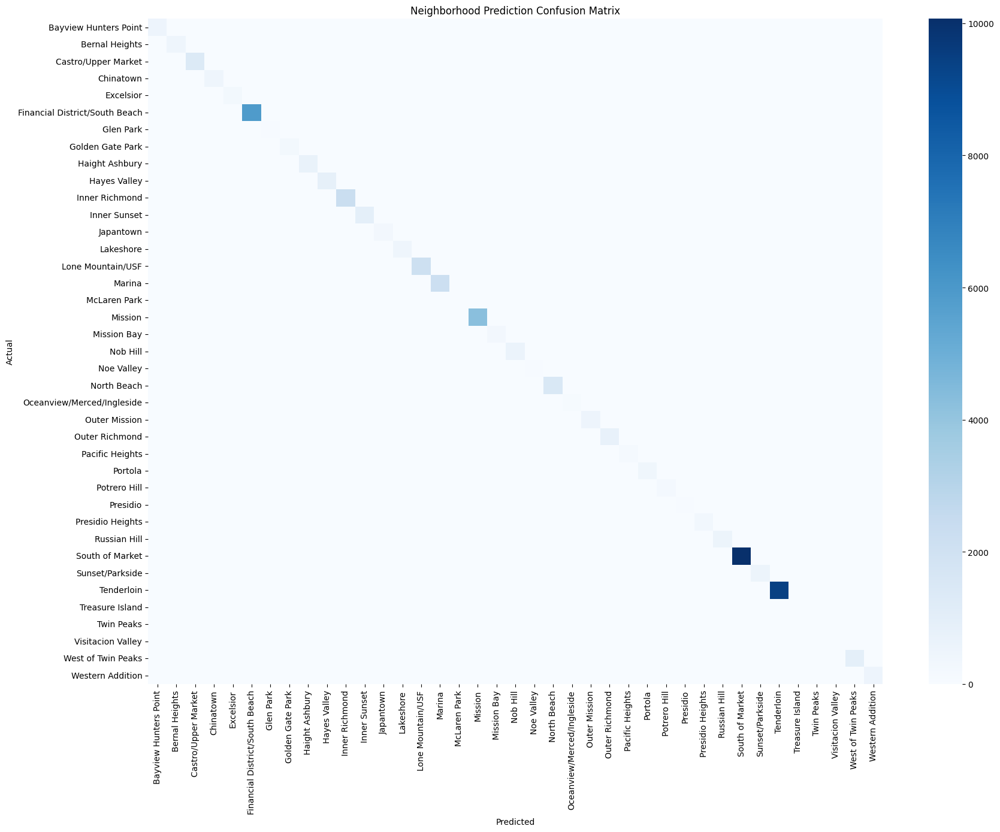

In [ ]:
from sklearn.metrics import confusion_matrix
import seaborn as sns
import matplotlib.pyplot as plt

conf_mat = confusion_matrix(y_test, y_pred, labels=class_labels)

plt.figure(figsize=(18, 14))
sns.heatmap(conf_mat, cmap='Blues', xticklabels=class_labels, yticklabels=class_labels)
plt.title("Neighborhood Prediction Confusion Matrix")
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.xticks(rotation=90)
plt.yticks(rotation=0)
plt.tight_layout()
plt.show()


In [ ]:
# Attach predicted neighborhood to X_test
X_test_copy = X_test.copy()
X_test_copy['Predicted Neighborhood'] = y_pred
X_test_copy['Actual Neighborhood'] = y_test.values

# Define shift with exact hour text
def assign_shift_with_hour(hour):
    if 6 <= hour <= 10:
        return "Morning (6–10 AM)"
    elif 11 <= hour <= 15:
        return "Midday (11 AM–3 PM)"
    elif 16 <= hour <= 20:
        return "Evening (4–8 PM)"
    else:
        return "Off-shift"

# Apply it
X_test_copy['Shift'] = X_test_copy['issue_hour'].apply(assign_shift_with_hour)


# Count predictions per neighborhood/shift
deployment_table = X_test_copy.groupby(['Shift', 'Predicted Neighborhood']).size().reset_index(name='Predicted Citations')
deployment_table = deployment_table.sort_values(by='Predicted Citations', ascending=False)

# View top recommendations per shift
deployment_table.head(10)


,Shift,Predicted Neighborhood,Predicted Citations
31,Evening (4–8 PM),South of Market,4137
33,Evening (4–8 PM),Tenderloin,3739
68,Midday (11 AM–3 PM),South of Market,2634
70,Midday (11 AM–3 PM),Tenderloin,2443
105,Morning (6–10 AM),South of Market,2422
80,Morning (6–10 AM),Financial District/South Beach,2402
107,Morning (6–10 AM),Tenderloin,2240
5,Evening (4–8 PM),Financial District/South Beach,1855
17,Evening (4–8 PM),Mission,1682
91,Morning (6–10 AM),Mission,1416


In [ ]:
import folium

# Create base map
m = folium.Map(location=[37.76, -122.45], zoom_start=13)

# Group by neighborhood and average lat/lon for marker
neigh_coords = df.groupby('analysis_neighborhood')[['latitude', 'longitude']].mean().dropna()

# Merge top patrol zones from predictions
top_zones = deployment_table.groupby('Predicted Neighborhood').sum().sort_values(by='Predicted Citations', ascending=False).head(15)
for zone in top_zones.index:
    if zone in neigh_coords.index:
        lat, lon = neigh_coords.loc[zone]
        folium.CircleMarker(
            location=[lat, lon],
            radius=8,
            popup=f"{zone} — Officers Needed: {top_zones.loc[zone, 'Predicted Citations']}",
            color="red",
            fill=True,
            fill_opacity=0.7
        ).add_to(m)

m


In [ ]:
# Save to CSV if needed
deployment_table.to_csv("officer_deployment_by_neighborhood.csv", index=False)


# User Input

In [ ]:
import numpy as np

# Positive samples (actual citations)
df_positive = df[['latitude', 'longitude', 'issue_hour', 'issue_weekday', 'issue_weekend']].dropna().copy()
df_positive['label'] = 1

# Generate random negative (non-citation) points within SF bounds
num_neg = len(df_positive)
np.random.seed(42)

lat_range = (37.70, 37.82)
lon_range = (-122.52, -122.36)

df_negative = pd.DataFrame({
    'latitude': np.random.uniform(lat_range[0], lat_range[1], num_neg),
    'longitude': np.random.uniform(lon_range[0], lon_range[1], num_neg),
    'issue_hour': np.random.randint(0, 24, num_neg),
    'issue_weekday': np.random.randint(0, 7, num_neg),
})
df_negative['issue_weekend'] = df_negative['issue_weekday'].apply(lambda x: 1 if x >= 5 else 0)
df_negative['label'] = 0

# Combine
df_binary = pd.concat([df_positive, df_negative]).sample(frac=1).reset_index(drop=True)


In [ ]:
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import classification_report, accuracy_score

# Features and labels
X = df_binary[['latitude', 'longitude', 'issue_hour', 'issue_weekday', 'issue_weekend']]
y = df_binary['label']

X_train, X_test, y_train, y_test = train_test_split(X, y, stratify=y, test_size=0.2, random_state=42)

# Train model
binary_model = RandomForestClassifier(random_state=42)
binary_model.fit(X_train, y_train)

# Evaluate
y_pred = binary_model.predict(X_test)
print("Accuracy:", accuracy_score(y_test, y_pred))
print(classification_report(y_test, y_pred))


Accuracy: 0.9881670405648928
              precision    recall  f1-score   support

           0       0.99      0.99      0.99     54382
           1       0.99      0.99      0.99     54382

    accuracy                           0.99    108764
   macro avg       0.99      0.99      0.99    108764
weighted avg       0.99      0.99      0.99    108764



In [ ]:
# Example user input
user_input = {
    'latitude': 37.7749,
    'longitude': -122.4194,
    'issue_hour': 9,
    'issue_weekday': 1,  # Monday
}
user_input['issue_weekend'] = 1 if user_input['issue_weekday'] >= 5 else 0

# Convert to DataFrame
input_df = pd.DataFrame([user_input])

# Predict
prob = binary_model.predict_proba(input_df)[0][1]  # Probability of citation
print(f"📍 Estimated citation risk: {round(prob * 100, 2)}%")


📍 Estimated citation risk: 51.0%


In [ ]:
!pip install gradio


In [ ]:
import gradio as gr

# Define prediction function
def predict_citation_risk(lat, lon, hour, weekday):
    weekend = 1 if weekday >= 5 else 0
    input_data = pd.DataFrame([{
        'latitude': lat,
        'longitude': lon,
        'issue_hour': hour,
        'issue_weekday': weekday,
        'issue_weekend': weekend
    }])

    prob = binary_model.predict_proba(input_data)[0][1]
    return f"📍 Estimated citation risk: {round(prob * 100, 2)}%"


In [ ]:
# Launch Gradio interface
gr.Interface(
    fn=predict_citation_risk,
    inputs=[
        gr.Number(label="Latitude"),
        gr.Number(label="Longitude"),
        gr.Slider(0, 23, label="Hour of Day"),
        gr.Slider(0, 6, label="Weekday (0=Mon, 6=Sun)")
    ],
    outputs="text",
    title="SFMTA Citation Risk Predictor",
    description="Estimate the likelihood of receiving a citation based on location and time."
).launch()


It looks like you are running Gradio on a hosted a Jupyter notebook. For the Gradio app to work, sharing must be enabled. Automatically setting `share=True` (you can turn this off by setting `share=False` in `launch()` explicitly).

Colab notebook detected. To show errors in colab notebook, set debug=True in launch()
* Running on public URL: https://5aae85e178ecba54db.gradio.live

This share link expires in 1 week. For free permanent hosting and GPU upgrades, run `gradio deploy` from the terminal in the working directory to deploy to Hugging Face Spaces (https://huggingface.co/spaces)


# Officer Deployment

In [ ]:
# Assign time shifts based on hour
def assign_shift(hour):
    if 6 <= hour <= 10:
        return 'Morning'
    elif 11 <= hour <= 15:
        return 'Midday'
    elif 16 <= hour <= 20:
        return 'Evening'
    else:
        return 'Off-shift'

# Create new column for shifts
zone_summary['shift'] = zone_summary['hour'].apply(assign_shift)

# Filter out Off-shift hours (e.g., 0–5 AM or late night)
shifted_df = zone_summary[zone_summary['shift'] != 'Off-shift']


In [ ]:
# Sort within each shift by score
top_zones_per_shift = shifted_df.sort_values(['shift', 'score'], ascending=[True, False])

# View top 5 per shift
for shift in ['Morning', 'Midday', 'Evening']:
    print(f"\n🚨 Top Zones for {shift} Shift:")
    display(top_zones_per_shift[top_zones_per_shift['shift'] == shift].head(5))



🚨 Top Zones for Morning Shift:


,hour,weekday,lat_bin,lon_bin,citation_count,avg_risk,score,officers_needed,shift
3079,8,1,37.777,-122.420,918,0.652053,0.889834,4,Morning
3911,8,3,37.777,-122.420,886,0.645882,0.866176,4,Morning
3499,8,2,37.777,-122.420,736,0.646607,0.768459,4,Morning
3251,8,1,37.805,-122.405,577,0.649623,0.665878,3,Morning
1384,7,1,37.777,-122.420,561,0.653950,0.657344,3,Morning



🚨 Top Zones for Midday Shift:


,hour,weekday,lat_bin,lon_bin,citation_count,avg_risk,score,officers_needed,shift
11295,13,1,37.777,-122.42,628,0.652778,0.700614,4,Midday
11437,13,2,37.777,-122.42,609,0.644986,0.684732,3,Midday
11576,13,3,37.777,-122.42,568,0.653481,0.661711,3,Midday
8993,11,1,37.777,-122.42,523,0.645626,0.628807,3,Midday
12881,15,2,37.777,-122.42,503,0.646226,0.616002,3,Midday



🚨 Top Zones for Evening Shift:


,hour,weekday,lat_bin,lon_bin,citation_count,avg_risk,score,officers_needed,shift
18367,18,2,37.777,-122.42,824,0.646080,0.825741,4,Evening
15079,16,3,37.777,-122.42,766,0.647898,0.788641,4,Evening
14352,16,1,37.777,-122.42,762,0.648682,0.786375,4,Evening
18707,18,3,37.777,-122.42,696,0.651194,0.744354,4,Evening
14729,16,2,37.777,-122.42,689,0.649519,0.739034,4,Evening
